### Comparison of the CMIP6 2100 projections of OGGM v1.6.1 to [Rounce et al. (2023)](https://doi.org/10.1126/science.abo1324)

--- 
**summary (figures are below):** 
- **OGGM v161 creates globally more glacier volume loss, specifically for very warm scenarios and for RGI19 (Antarctic and Subantarctic).**
- The glacier volume is globally around 13% and in RGI19 20-30% larger in Rounce et al., (2023) compared to OGGM v1.6.1 (or Farinotti et al., 2019) at the initial state. The estimated numbers roughly coincide with the initial glacier volume given by Rounce et al., (2023) Table S4, where the glacier volume of each RGI region of year 2015 is listed. The larger initial glacier volume might explain, why the Rounce et al., (2023) simulations result in less glacier volume loss than the OGGM v161 projections. However, OGGM also seems to be more temperature-sensitive and does not account for calving/frontal ablation. 
    - The reason for the larger initial glacier volume in Rounce et al., (2023) is that the Glen-A are calibrated to match Farinotti et al. (2019) assuming that the glaciers are land-terminating, but then when frontal ablation is added the ice volume gets larger and no longer matches.
- In addition the spread between the projections of the different GCMs is larger for OGGM v161 than for Rounce et al., (2023). A reason could be that in Rounce et al., 2023, the differences between the GCMs are already partly taken into account during the initialisation while for OGGM, at initialisation, all projections start at the same volume. Globally, in Rounce et al., 2023, the GCM which has the largest initial volume actually results in the smallest glacier volume at the end (and vice-versa), which results in absolute uncertainties being relatively small around 2040. This has probably also an influence on the relative uncertainties...
---

*The datasets generated for Rounce et al., (2023) were downloaded from the National Snow and Ice Data Center (NSIDC) at https://nsidc.org/data/hma2_ggp/versions/1. If you have access to the OGGM cluster, you don't need to download them again, as they are already here: https://cluster.klima.uni-bremen.de/~lschuster/rounce_2023_data/* 

The aggregated output from Rounce et al., (2023) has also been visualised in an App, that you can access here: https://cluster.klima.uni-bremen.de/~lschuster/rounce_2023_data/0_exploratory_data_analysis/global_future_glacier-app_rounce_delta_T_en_publication_version.html

Note that we will compare here the common running glaicers of both studies. So we created additional aggregated files (those for OGGM are inside of https://cluster.klima.uni-bremen.de/~oggm/oggm-standard-projections/analysis_notebooks/1.6.1/common_running_rounce_et_al_2023/ with the same struture as the oggm-standard-projections-csv-files).
    

In [33]:
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['figure.figsize'] = (14, 8)

We estimate first the common running glaciers between OGGM v16 and Rounce et al., 2023, and then we sum up these common running glaciers for every RGI region (here done for the Rounce et al., 2023 data). The aggregated common running files of oggm were created in [this notebook](https://nbviewer.org/urls/cluster.klima.uni-bremen.de/~oggm/oggm-standard-projections/oggm-standard-projections-csv-files/notebooks/aggregate_csv_files_1.6.1.ipynb?flush_cache=true). 

In [34]:
aggregate = False
if aggregate:
    # this can take some time ... 
    import json
    with open(f'{path}/common_running_2100/rgi_ids_missing.json', 'r') as f:
        invalid_per_reg_oggm = json.load(f)
    rgi_meta = pd.read_hdf('/home/www/oggm/rgi/rgi62_stats.h5')
    rgi_meta = rgi_meta.loc[rgi_meta.Connect != 2]

    ### path to Rounce et al. (2023) data 
    fpath = '/home/www/lschuster/rounce_2023_data'
    
    # get the missing glaciers in ROunce et al., 2023 and in OGGM
    invalid_per_reg_pygem_oggm = {}
    # get all glaciers and some SSP scenarios
    # there are also RCP scenarios from CMIP5 available  (but we don't use them here for the moment ... )
    for r in np.arange(1,20,1):
        if r<10:
            r = f'0{r}'
        else:
            r = str(r)

        rgi_reg = f'RGI{r}'
        invalid_per_reg_pygem_oggm[rgi_reg] = set()
        for ssp in ['ssp126', 'ssp245','ssp370', 'ssp585']:
            #['ssp119','ssp126', 'ssp245', 'ssp370', 'ssp585']: #'ssp119',
            _dt = xr.open_dataset(f'{fpath}/R{r}_glac_mass_annual_50sets_2000_2100-{ssp}.nc').glac_mass_annual.sel(year=2020)
            for m in _dt.model:
                _dt_sel = _dt.sel(model=m)
                _dt_sel = _dt_sel.set_index(glacier='RGIId')
                rounce_rgi_reg_working = _dt_sel.glacier.values
                rgi_meta_rgi_reg = rgi_meta.loc[rgi_meta.O1Region == r]
                # in the ROunce data there are no NaN values, so if a glacier is missing, it is missing for all GCMs and SSPs
                # so, only the unmissing ids are given 
                rounce_missing = rgi_meta_rgi_reg.drop(rounce_rgi_reg_working).index
                missing_ids_both = list(set(rounce_missing).union(invalid_per_reg_oggm[rgi_reg]))
                invalid_per_reg_pygem_oggm[rgi_reg] = list(set(invalid_per_reg_pygem_oggm[rgi_reg]).union(missing_ids_both))
    
    for k, v in invalid_per_reg_pygem_oggm.items():
        invalid_per_reg_pygem_oggm[k] = list(v)
    with open(f'/home/www/oggm/oggm-standard-projections/analysis_notebooks/1.6.1/common_running_rounce_et_al_2023/rgi_ids_missing_rounce_et_al_or_oggm.json', 'w') as f:
        json.dump(invalid_per_reg_pygem_oggm, f)
    
    # get all per-glacier data and sum it up per RGI region, for three SSP scenarios
    # only take the glaciers that run for all GCMs and SSPs within Rounce et al., 2023
    # there are also RCP scenarios from CMIP5 available  (but we don't use them here for the moment ... )
    dt_ssp_l = []
    for r in np.arange(1,20):
        print(r)
        if r<10:
            r = f'0{r}'
        else:
            r = str(r)

        dts = [] 
        for ssp in ['ssp126', 'ssp245','ssp370', 'ssp585']:
            _dt =  xr.open_dataset(f'{fpath}/R{r}_glac_mass_annual_50sets_2000_2100-{ssp}.nc')
            _dt = _dt.set_index(glacier = 'RGIId')
            _dt = _dt.set_index(model = 'Climate_Model')
            # this is somehow faster than summing directly over xarray ...
            #  _dt = _dt.isel(glacier=~_dt.RGIId.isin(invalid_per_reg_pygem_oggm[f'RGI{r}']))
            # _dt = _dt.sum(dim='glacier')
            _dpd = _dt.to_dataframe()[['glac_mass_annual']].reset_index()
            _dpd = _dpd.where(~_dpd.glacier.isin(invalid_per_reg_pygem_oggm[f'RGI{r}']))
            _dt = _dpd.groupby(['model', 'year']).sum().to_xarray()
            #_dt = _dt.expand_dims('scenario')
            _dt.coords['scenario'] = ssp
            dts.append(_dt)
            print(ssp)
        dt_ssp = xr.concat(dts, dim = 'scenario')
        dt_ssp.coords['rgi_reg'] = r
        dt_ssp = dt_ssp.expand_dims('rgi_reg')
        dt_ssp_l.append(dt_ssp)
        print(r, 'finished')
    dt_ssp_all = xr.concat(dt_ssp_l, dim='rgi_reg')
    dt_ssp_all = dt_ssp_all.rename_dims({'model':'gcm', 
                                         #'glacier':'rgi_id',
                                         'year':'time'})
    dt_ssp_all = dt_ssp_all[['glac_mass_annual', 'rgi_reg']]
    dt_ssp_all = dt_ssp_all.set_index(gcm='model')
    #dt_ssp_all = dt_ssp_all.set_index(rgi_id='glacier')
    dt_ssp_all = dt_ssp_all.set_index(time = 'year')
    dt_ssp_all['gcm'] = [x.upper() for x in dt_ssp_all.gcm.values]
    dt_ssp_all.to_netcdf('/home/www/oggm/oggm-standard-projections/analysis_notebooks/rounce_et_al_2023_glac_mass_common_glacier_aggregated.nc')

else:
    #with open(f'/home/www/oggm/oggm-standard-projections/analysis_notebooks/1.6.1/common_running_rounce_et_al_2023/rgi_ids_missing_rounce_et_al_or_oggm.json', 'r') as f:
    #    invalid_per_reg_pygem_oggm = json.load(f)
    dt_ssp_all = xr.open_dataset('/home/www/oggm/oggm-standard-projections/analysis_notebooks/rounce_et_al_2023_glac_mass_common_glacier_aggregated.nc')
dt_ssp_all_sum_rel_glob = 100*dt_ssp_all.sum(dim='rgi_reg')/dt_ssp_all.sel(time=2020).sum(dim='rgi_reg')
dt_ssp_all_sum_rel = 100*dt_ssp_all/dt_ssp_all.sel(time=2020)


Check GCMs:

In [35]:
# let's take the common_running_rounce_et_al_2023 files
path_oggm_data = '/home/www/oggm/oggm-standard-projections/analysis_notebooks/1.6.1/'
ssp = 'ssp126'
idir = path_oggm_data + 'common_running_rounce_et_al_2023/' + f'volume/CMIP6/2100/global/'
df_glob = pd.read_csv(idir + f'{ssp}.csv', index_col=0)
common_gcms = list(set(list(df_glob.columns)).intersection(list(dt_ssp_all_sum_rel.gcm.values)))
assert len(common_gcms) == len(dt_ssp_all_sum_rel.gcm)


-> perfect, we have all the GCMs from Rounce et al., 2023 computed ...


#### Global plot:

Remaining global glacier volume in 2100: 
ssp126
Rounce et al. (2023): 73.7 %
OGGM v1.6:   70.2 %
ssp245
Rounce et al. (2023): 69.5 %
OGGM v1.6:   63.7 %
ssp370
Rounce et al. (2023): 61.9 %
OGGM v1.6:   53.8 %
ssp585
Rounce et al. (2023): 57.6 %
OGGM v1.6:   47.6 %


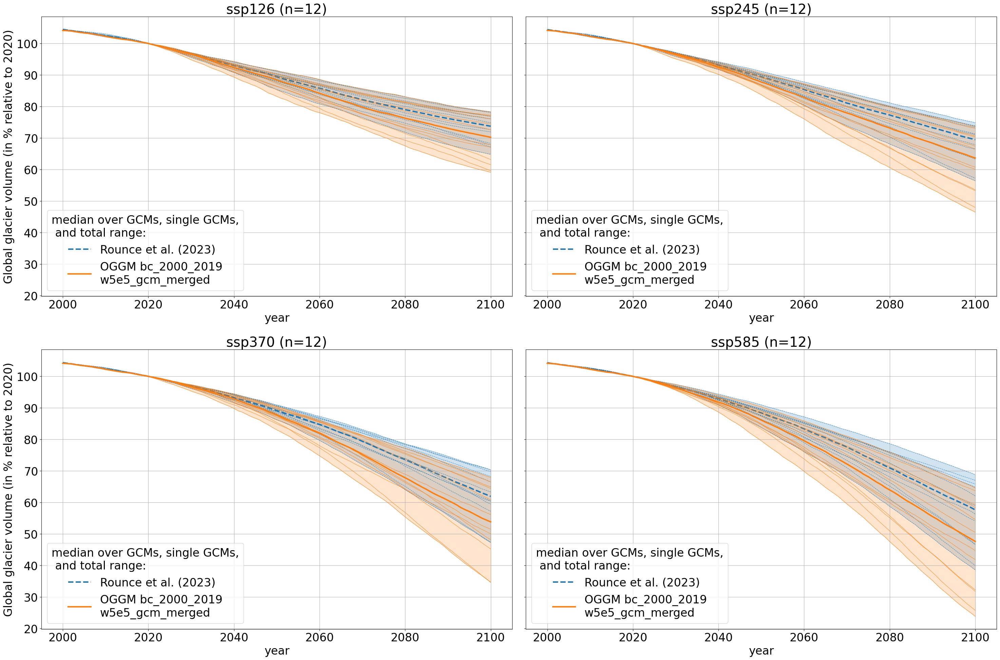

In [5]:
plt.rc('font', size=24)

fig, axs = plt.subplots(2,2,sharey=True, figsize=(30,20))

print('Remaining global glacier volume in 2100: ')
for j,ssp in enumerate(['ssp126', 'ssp245','ssp370', 'ssp585']): #'ssp245', 'ssp370',
    ax = axs.flatten()[j]
    print(ssp)
    # ROUNCE 
    pd_rounce_sel_rel = dt_ssp_all_sum_rel_glob.sel(scenario=ssp).sel(gcm=common_gcms).to_dataframe().reset_index().drop(columns='scenario').pivot(columns='gcm', index='time')
    pd_rounce_sel_rel = pd_rounce_sel_rel.loc[2000:2100]
    len_gcm = len(dt_ssp_all_sum_rel_glob.sel(scenario=ssp).gcm)
    ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel.median(axis=1), lw=3,  color='C0', label = 'Rounce et al. (2023)', ls='--')
    ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel, lw=0.8, alpha = 0.8, color='C0', ls='--');
    ax.fill_between(pd_rounce_sel_rel.index, pd_rounce_sel_rel.min(axis=1), pd_rounce_sel_rel.max(axis=1), alpha=0.2, color='C0')
    print('Rounce et al. (2023):',  np.round(pd_rounce_sel_rel.iloc[-1].median(),1),'%')
    
    # OGGM 
    idir = path_oggm_data + 'common_running_rounce_et_al_2023/' + f'volume/CMIP6/2100/global/'
    df = pd.read_csv(idir + f'{ssp}.csv', index_col=0)    
    df = df[common_gcms]
    #print(df.columns.values)
    df_rel = 100*df/df.loc[2020]
    ax.plot(df.index, df_rel.median(axis=1), lw=3, color='C1', label = 'OGGM bc_2000_2019\nw5e5_gcm_merged')
    ax.plot(df.index, df_rel, lw=0.8, alpha = 0.8, color='C1');
    ax.fill_between(df.index, df_rel.min(axis=1), df_rel.max(axis=1), alpha=0.2, color='C1')
    
    print('OGGM v1.6:  ', np.round(df_rel.iloc[-1].median(),1),'%')
    
    ax.set_title(f'{ssp} (n={len(common_gcms)})')
    if j == 0 or j==2:
        ax.set_ylabel('Global glacier volume (in % relative to 2020)')
    else:
        ax.set_ylabel('')
    ax.set_xlabel('year')
    ax.grid()

    ax.legend(title='median over GCMs, single GCMs,\n and total range:')
plt.tight_layout()
plt.savefig('global_glacier_volume_comparison_to_rounce_et_al_2023.png')

**Regionally**

In [36]:
# let's add some names to the RGI regions:
d_reg_num_name = {}
d_reg_num_name['01'] = 'Alaska'
d_reg_num_name['02'] = 'Western Canada & USA'
d_reg_num_name['03'] = 'Arctic Canada North'
d_reg_num_name['04'] = 'Arctic Canada South'
d_reg_num_name['05'] = 'Greenland'
d_reg_num_name['06'] = 'Iceland'
d_reg_num_name['07'] = 'Svalbard and Jan Mayen'
d_reg_num_name['08'] = 'Scandinavia'
d_reg_num_name['09'] = 'Russian Arctic'
d_reg_num_name['10'] = 'North Asia'
d_reg_num_name['11'] = 'Central Europe'
d_reg_num_name['12'] = 'Caucasus and Middle East'
d_reg_num_name['13'] = 'Central Asia'
d_reg_num_name['14'] = 'South Asia West'
d_reg_num_name['15'] = 'South Asia East'
d_reg_num_name['16'] = 'Low Latitudes'
d_reg_num_name['17'] = 'Southern Andes'
d_reg_num_name['18'] = 'New Zealand'
d_reg_num_name['19'] = 'Antarctic and Subantarctic'

ssp245
ssp585


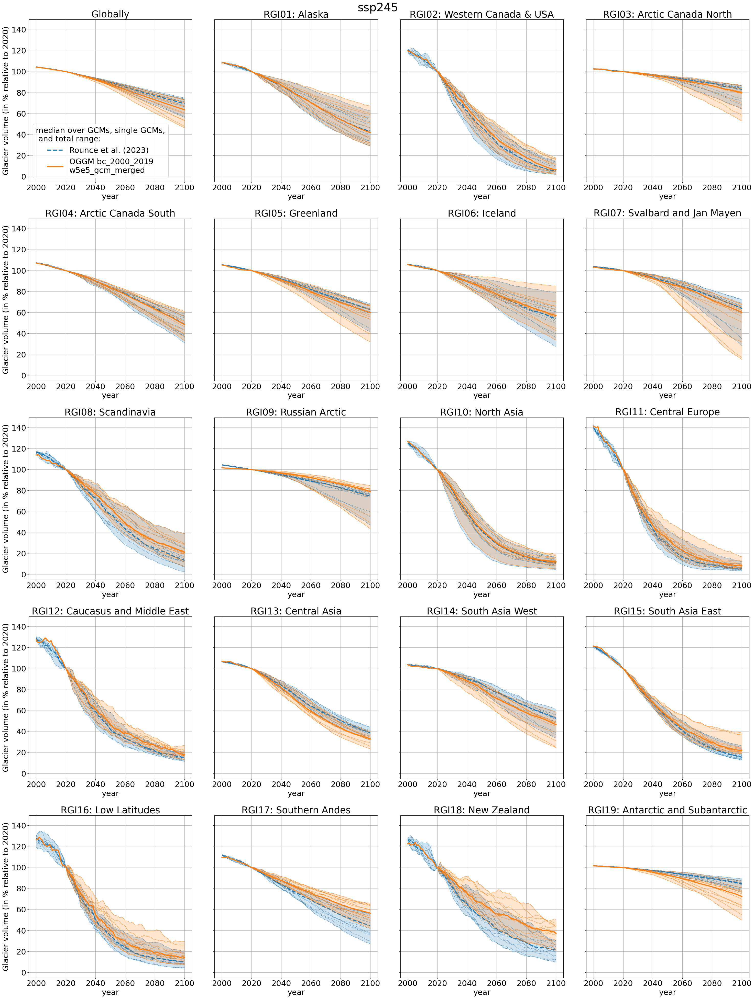

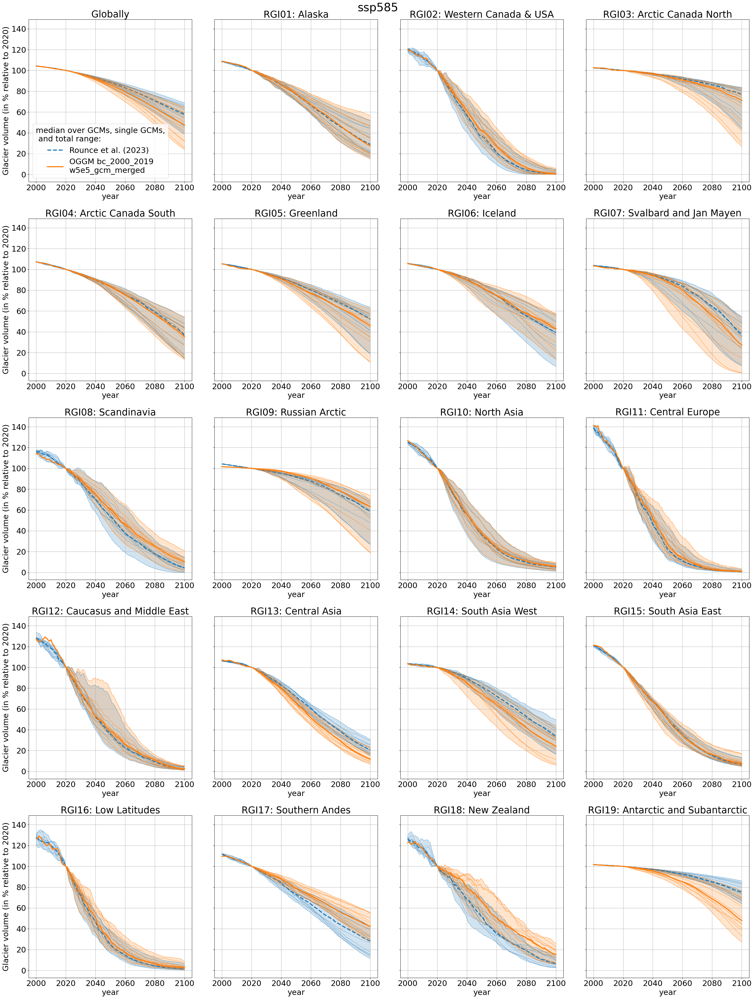

In [26]:

for ssp in ['ssp245', 'ssp585']:
    dt_ssp_all_sum_rel_ssp = dt_ssp_all_sum_rel.sel(scenario=ssp)

    fig, axs = plt.subplots(5,4, figsize=(30,40), sharey=True)
    plt.rc('font', size=22)

    ### GLOBALLY
    ax = axs.flatten()[0]
    print(ssp)
    # ROUNCE 
    pd_rounce_sel_rel = dt_ssp_all_sum_rel_glob.sel(scenario=ssp).sel(gcm=common_gcms).to_dataframe().reset_index().drop(columns='scenario').pivot(columns='gcm', index='time')
    pd_rounce_sel_rel = pd_rounce_sel_rel.loc[2000:2100]
    len_gcm = len(dt_ssp_all_sum_rel_glob.sel(scenario=ssp).gcm)
    ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel.median(axis=1), lw=3,  color='C0', label = 'Rounce et al. (2023)', ls='--')
    ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel, lw=0.8, alpha = 0.8, color='C0', ls='--');
    ax.fill_between(pd_rounce_sel_rel.index, pd_rounce_sel_rel.min(axis=1), pd_rounce_sel_rel.max(axis=1), alpha=0.2, color='C0')
    
    idir = path_oggm_data + 'common_running_rounce_et_al_2023/' + f'volume/CMIP6/2100/global/'
    df = pd.read_csv(idir + f'{ssp}.csv', index_col=0)    
    df = df[common_gcms]
    #print(df.columns.values)
    df_rel = 100*df/df.loc[2020]
    ax.plot(df.index, df_rel.median(axis=1), lw=3, color='C1', label = 'OGGM bc_2000_2019\nw5e5_gcm_merged')
    ax.plot(df.index, df_rel, lw=0.8, alpha = 0.8, color='C1');
    ax.fill_between(df.index, df_rel.min(axis=1), df_rel.max(axis=1), alpha=0.2, color='C1')
    ax.legend(title='median over GCMs, single GCMs,\n and total range:')
    ax.set_ylabel('Glacier volume (in % relative to 2020)')
    ax.set_xlabel('year')
    ax.grid()
    ax.set_title('Globally')

    for j,r0 in enumerate(np.arange(1,20,1)): #np.arange(1,20,1):
        if r0<10:
            r = f'0{r0}'
        else:
            r = str(r0)

        ax =axs.flatten()[r0]
        # Rounce et al., (2023)
        pd_rounce_sel_rel = dt_ssp_all_sum_rel_ssp.sel(rgi_reg=r).sel(gcm=common_gcms).to_dataframe().reset_index().drop(columns=['scenario','rgi_reg']).pivot(columns='gcm', index='time')
        pd_rounce_sel_rel = pd_rounce_sel_rel.loc[2000:2100]
        len_gcm = len(dt_ssp_all_sum_rel_glob.sel(scenario=ssp).gcm)
        ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel.median(axis=1), lw=3,  color='C0', label = 'Rounce et al. (2023)', ls='--')
        ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel, lw=0.8, alpha = 0.8, color='C0', ls='--');
        ax.fill_between(pd_rounce_sel_rel.index, pd_rounce_sel_rel.min(axis=1), pd_rounce_sel_rel.max(axis=1), alpha=0.2, color='C0')

        # OGGM 
        idir = path_oggm_data + 'common_running_rounce_et_al_2023/' + f'volume/CMIP6/2100/RGI{r}/'
        df = pd.read_csv(idir + f'{ssp}.csv', index_col=0)    
        df = df[common_gcms]
        #print(df.columns.values)
        df_rel = 100*df/df.loc[2020]
        ax.plot(df.index, df_rel.median(axis=1), lw=3, color='C1', label = 'OGGM bc_2000_2019\nw5e5_gcm_merged')
        ax.plot(df.index, df_rel, lw=0.8, alpha = 0.8, color='C1');
        ax.fill_between(df.index, df_rel.min(axis=1), df_rel.max(axis=1), alpha=0.2, color='C1')

        ax.set_title(f'RGI{r}: {d_reg_num_name[r]}')
        if r0 in [4,8,12,16]:
            ax.set_ylabel('Glacier volume (in % relative to 2020)')
        else:
            ax.set_ylabel('')
        ax.set_xlabel('year')
        ax.grid()
    plt.suptitle(ssp, fontsize=32);

    plt.tight_layout()

    plt.savefig(f'global_glacier_volume_comparison_to_rounce_et_al_2023_{ssp}.png')


**Regionally, but in absolute numbers**

In [37]:
# also add the Farinotti ice thickness consensus estimate
rgi_meta = pd.read_hdf('/home/www/oggm/rgi/rgi62_stats.h5')
rgi_meta = rgi_meta.loc[rgi_meta.Connect != 2]
import oggm
df_itmix = pd.read_hdf(oggm.utils.get_demo_file('rgi62_itmix_df.h5'))

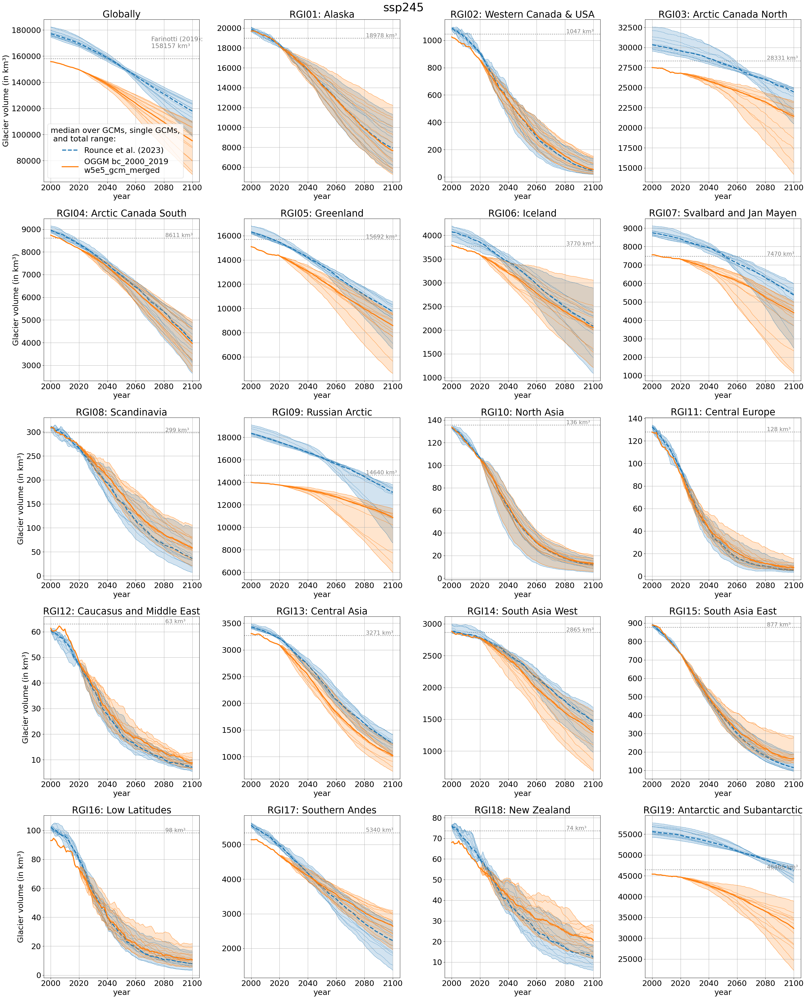

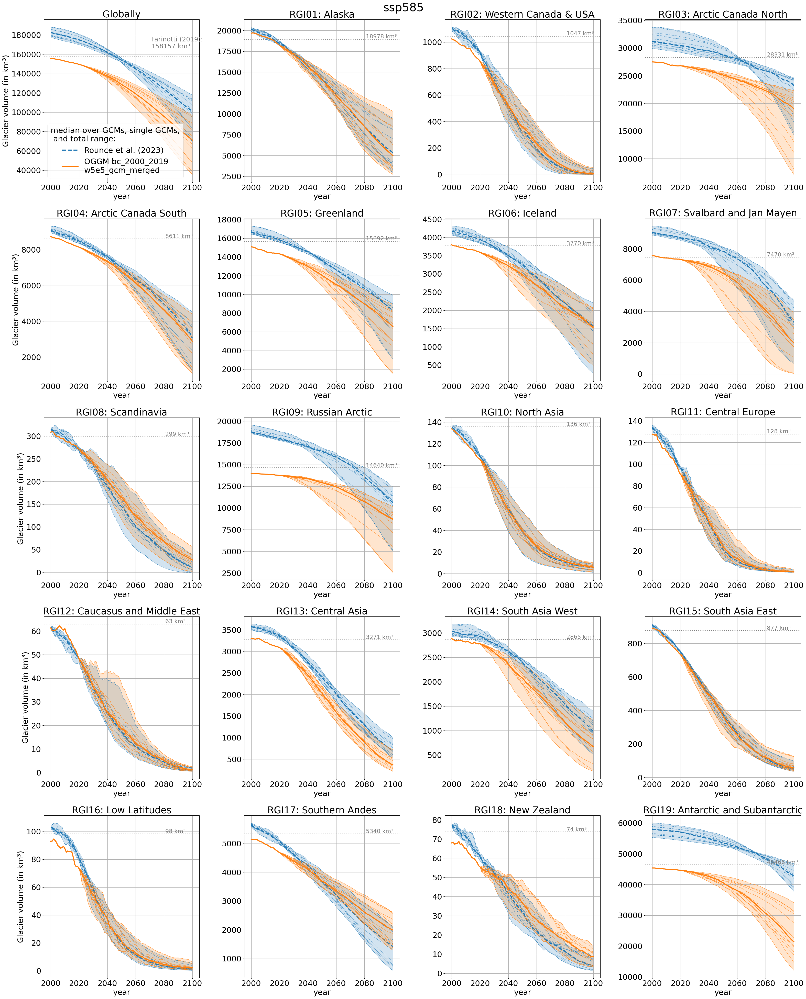

In [38]:
for ssp in ['ssp245','ssp585']:
    dt_ssp_all_sum_ssp = dt_ssp_all.sel(scenario=ssp)
    dt_ssp_all_sum_glob = dt_ssp_all.sum(dim='rgi_reg')
    fig, axs = plt.subplots(5,4, figsize=(32,40))
    plt.rc('font', size=22)

    ### GLOBALLY
    ax = axs.flatten()[0]
    
    vol = df_itmix.loc[rgi_meta.index]['vol_itmix_m3'].sum()*1e-9
    ax.axhline(vol, ls = ':', color='grey', lw=2)
    ax.text(2071, vol*1.05, f'Farinotti (2019):\n{vol:.0f} km³', fontsize=18, color='grey')
    # ROUNCE 
    pd_rounce_sel_rel = dt_ssp_all_sum_glob.sel(scenario=ssp).sel(gcm=common_gcms).to_dataframe().reset_index().drop(columns='scenario').pivot(columns='gcm', index='time')
    pd_rounce_sel_rel = pd_rounce_sel_rel.loc[2000:2100]*1e-9/900
    len_gcm = len(dt_ssp_all_sum_rel_glob.sel(scenario=ssp).gcm)
    ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel.median(axis=1), lw=3,  color='C0', label = 'Rounce et al. (2023)', ls='--')
    ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel, lw=0.8, alpha = 0.8, color='C0', ls='--');
    ax.fill_between(pd_rounce_sel_rel.index, pd_rounce_sel_rel.min(axis=1), pd_rounce_sel_rel.max(axis=1), alpha=0.2, color='C0')
    
    idir = path_oggm_data + 'common_running_rounce_et_al_2023/' + f'volume/CMIP6/2100/global/'
    df = pd.read_csv(idir + f'{ssp}.csv', index_col=0)    
    df = df[common_gcms]
    #print(df.columns.values)
    df_rel = df*1e-9 #/df.loc[2020]
    ax.plot(df.index, df_rel.median(axis=1), lw=3, color='C1', label = 'OGGM bc_2000_2019\nw5e5_gcm_merged')
    ax.plot(df.index, df_rel, lw=0.8, alpha = 0.8, color='C1');
    ax.fill_between(df.index, df_rel.min(axis=1), df_rel.max(axis=1), alpha=0.2, color='C1')
    ax.legend(title='median over GCMs, single GCMs,\n and total range:')
    ax.set_ylabel('Glacier volume (in km³)')
    ax.set_xlabel('year')
    ax.grid()
    ax.set_title('Globally')

    for j,r0 in enumerate(np.arange(1,20,1)): #np.arange(1,20,1):
        if r0<10:
            r = f'0{r0}'
        else:
            r = str(r0)
        ax =axs.flatten()[r0]
        
        rgis = rgi_meta.loc[rgi_meta.O1Region==r].index.values
        vol = df_itmix.loc[rgis]['vol_itmix_m3'].sum()*1e-9
        ax.axhline(vol, ls = ':', color='grey', lw=2)
        ax.text(2081, vol*1.005, f'{vol:.0f} km³', fontsize=16, color='grey')
        # Rounce et al., (2023)
        pd_rounce_sel_rel = dt_ssp_all_sum_ssp.sel(rgi_reg=r).sel(gcm=common_gcms).to_dataframe().reset_index().drop(columns=['scenario','rgi_reg']).pivot(columns='gcm', index='time')
        pd_rounce_sel_rel = pd_rounce_sel_rel.loc[2000:2100]*1e-9/900
        len_gcm = len(dt_ssp_all_sum_rel_glob.sel(scenario=ssp).gcm)
        ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel.median(axis=1), lw=3,  color='C0', label = 'Rounce et al. (2023)', ls='--')
        ax.plot(pd_rounce_sel_rel.index, pd_rounce_sel_rel, lw=0.8, alpha = 0.8, color='C0', ls='--');
        ax.fill_between(pd_rounce_sel_rel.index, pd_rounce_sel_rel.min(axis=1), pd_rounce_sel_rel.max(axis=1), alpha=0.2, color='C0')

        # OGGM 
        idir = path_oggm_data + 'common_running_rounce_et_al_2023/' + f'volume/CMIP6/2100/RGI{r}/'
        df = pd.read_csv(idir + f'{ssp}.csv', index_col=0)    
        df = df[common_gcms]
        #print(df.columns.values)
        df_rel = df*1e-9
        ax.plot(df.index, df_rel.median(axis=1), lw=3, color='C1', label = 'OGGM bc_2000_2019\nw5e5_gcm_merged')
        ax.plot(df.index, df_rel, lw=0.8, alpha = 0.8, color='C1');
        ax.fill_between(df.index, df_rel.min(axis=1), df_rel.max(axis=1), alpha=0.2, color='C1')

        ax.set_title(f'RGI{r}: {d_reg_num_name[r]}')
        if r0 in [4,8,12,16]:
            ax.set_ylabel('Glacier volume (in km³)')
        else:
            ax.set_ylabel('')
        ax.set_xlabel('year')
        ax.grid()
    plt.suptitle(ssp, fontsize=32);
    plt.tight_layout()

    plt.savefig(f'global_glacier_volume_comparison_to_rounce_et_al_2023_{ssp}_absolute_numbers.png')

In [29]:
# global initial glacier volume fraction: Rounce vs OGGM 
vol = df_itmix.loc[rgi_meta.index]['vol_itmix_m3'].sum()*1e-9
(dt_ssp_all_sum_glob.sel(time=2000).glac_mass_annual*1e-9/900/vol).median()

<xarray.DataArray 'glac_mass_annual' ()>
array(1.12582292)
Coordinates:
    time     float64 2e+03

#### Compare the largest glacier of RGI19 in 2100 of Rounce et al., 2023 to OGGM v1.6.1
(for that we need the raw oggm-output files and the non)

In [20]:
# Rounce et al
fpath = '/home/www/lschuster/rounce_2023_data'

# just choose one GCM and ssp585
_dt =  xr.open_dataset(f'{fpath}/R19_glac_mass_annual_50sets_2000_2100-ssp585.nc').isel(model=0)
gcm_sel = _dt.Climate_Model.values
_dt = _dt.set_index(glacier='RGIId')
# convert to volume 
rounce_2000_vol_19 = _dt.glac_mass_annual.sum(dim='glacier').sel(year=2000)/900

# oggm
oggm_path_rgi19 = f'/home/www/oggm/oggm-standard-projections/oggm_v16/2023.3/CMIP6/2100/RGI19/run_hydro_w5e5_gcm_merged_{gcm_sel}_ssp585_bc_2000_2019_Batch_*.nc'
with xr.open_mfdataset(oggm_path_rgi19) as ds:
    ds_oggm_2000 = ds[['volume']].sel(time=2000).sum(dim='rgi_id').load().volume
median_2000_vol = np.median([rounce_2000_vol_19,ds_oggm_2000])


Text(0, 0.5, 'Glacier volume change (in %)\nrelative to median RGI 19 initial glacier volume)')

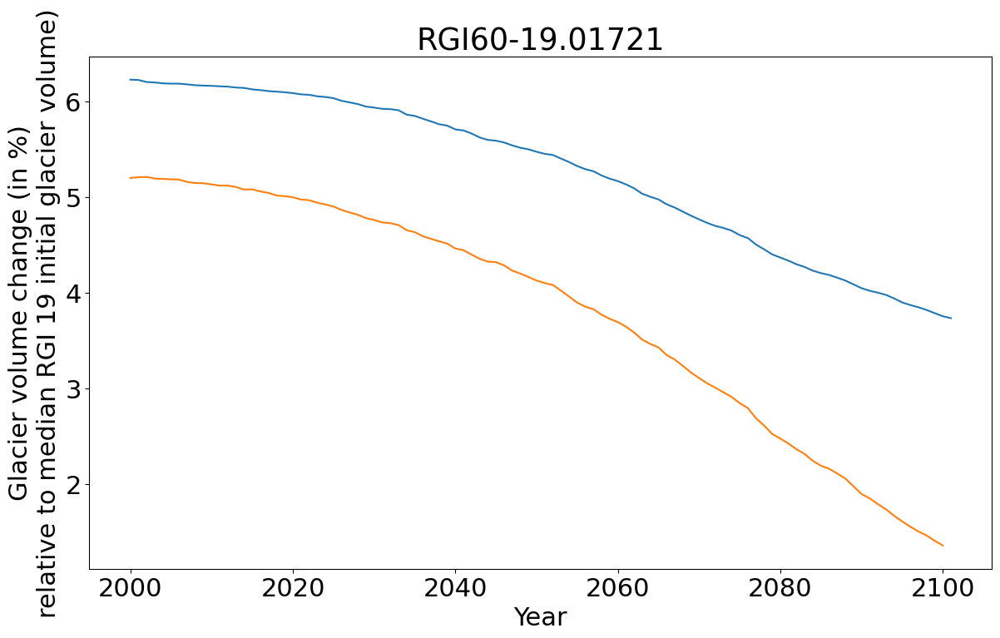

In [21]:
#rounce 
_dt_rel = (100*_dt.glac_mass_annual/900/median_2000_vol)
index_max_glac =_dt_rel.sel(year=2100).idxmax(dim='glacier')
_dt_rel_sel = _dt_rel.sel(glacier=index_max_glac.values)

#oggm
with xr.open_mfdataset(oggm_path_rgi19) as ds:
    ds_oggm_rel_sel = (100*ds[['volume']].sel(rgi_id=index_max_glac.values)/median_2000_vol).load()
plt.plot(_dt_rel_sel.year, _dt_rel_sel, label='Rounce et al., (2023)')
plt.plot(ds_oggm_rel_sel.time, ds_oggm_rel_sel.volume, label='OGGM v1.6.1')
plt.title(index_max_glac.values)
plt.xlabel('Year')
plt.ylabel('Glacier volume change (in %)\nrelative to median RGI 19 initial glacier volume)')

**Another example glacier**

Text(0, 0.5, 'Glacier volume change (in %)\nrelative to median RGI 19 initial glacier volume)')

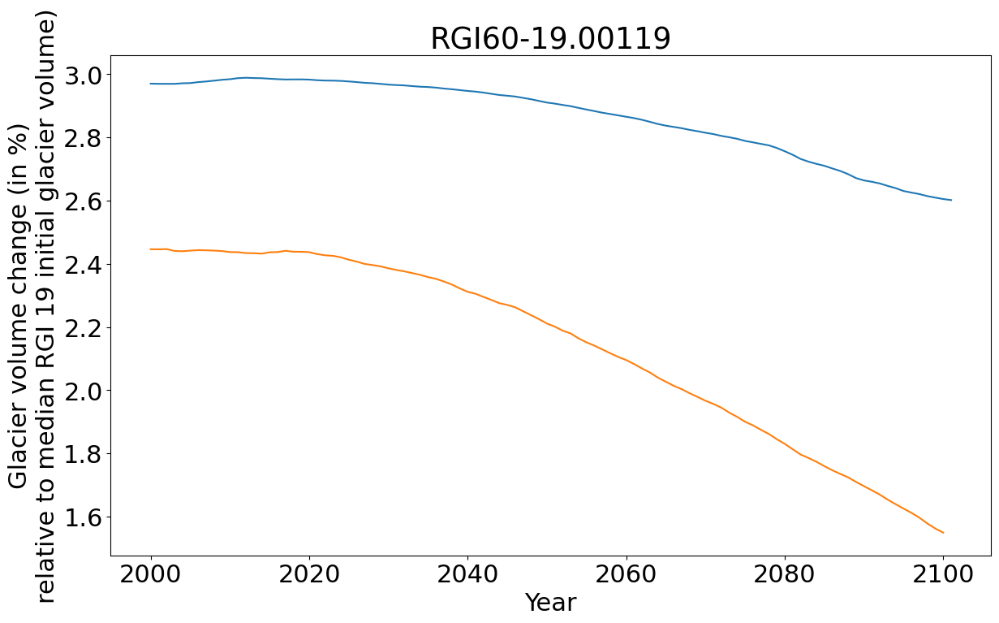

In [22]:
example_glacier = 'RGI60-19.00119'
# 
_dt_rel = (100*_dt.glac_mass_annual/900/median_2000_vol)
index_max_glac =_dt_rel.sel(year=2100).argmax(dim='glacier')
_dt_rel_sel = _dt_rel.sel(glacier= example_glacier)

#oggm
with xr.open_mfdataset(oggm_path_rgi19) as ds:
    ds_oggm_rel_sel = (100*ds[['volume']].sel(rgi_id=example_glacier)/median_2000_vol).load()
plt.plot(_dt_rel_sel.year, _dt_rel_sel, label='Rounce et al., (2023)')
plt.plot(ds_oggm_rel_sel.time, ds_oggm_rel_sel.volume, label='OGGM v1.6.1')
plt.title(example_glacier)
plt.xlabel('Year')
plt.ylabel('Glacier volume change (in %)\nrelative to median RGI 19 initial glacier volume)')

- another example glacier which is quite big and  where the volume in 2100 of Rounce et al. 2023 is still larger than the initial volume from OGGM 
